# Master in Applied Artificial Intelligence

## Course: *Computer Vision for Images and Video*

### **6.4 Google Colab** - Line extraction with Canny algorithm

---

**Institution:** Tecnológico de Monterrey

**Instructors:** Gilberto Ochoa Ruiz, Daniel Flores Araiza, Ma. del Refugio Meléndez Alfaro

**Authors (Team 38):** 

|  FULL NAME                      |     STUDENT ID    | 
| :--------------------------:    |:-----------------:|
| Alejandro Díaz Villagómez       |  A01276769        | 
| Carlos Rodrigo Sánchez Sierra   |  A01424454        | 
| Emiliano Saucedo Arriola        |  A01659258        | 

**Date:** October 19th, 2025

---

# 6. Sobel and Canny Edge Detection

## Table of Contents
1. [Libraries](#libraries)
2. [Sobel Edge Detection](#sobel)
3. [Canny Edge Detection](#canny)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [1]:
import cv2
import skimage
import numpy as np
from scipy import ndimage
from skimage import exposure, util
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.ndimage import convolve
from scipy.ndimage import gaussian_filter as gauss
from scipy.ndimage import median_filter as med

## Sobel Edge Detection <a class="anchor" id="sobel" ></a>

As a first step in extracting features, you will apply the Sobel edge detection algorithm. This finds regions of the image with large gradient values in multiple directions. Regions with high omnidirectional gradient are likely to be edges or transitions in the pixel values. 

The code in the cell below applies the Sobel algorithm to the median filtered image, using these steps:

1. Convert the color image to grayscale for the gradient calculation since it is two dimensional.
2. Compute the gradient in the x and y (horizontal and vertical) directions. 
3. Compute the magnitude of the gradient.
4. Normalize the gradient values. 

In [2]:
def edge_sobel(image):
    from scipy import ndimage
    import skimage.color as sc
    import numpy as np
    image = sc.rgb2gray(image) # Convert color image to gray scale
    dx = ndimage.sobel(image, 1)  # horizontal derivative
    dy = ndimage.sobel(image, 0)  # vertical derivative
    mag = np.hypot(dx, dy)  # magnitude
    mag *= 255.0 / np.amax(mag)  # normalize (Q&D)
    mag = mag.astype(np.uint8)
    return mag

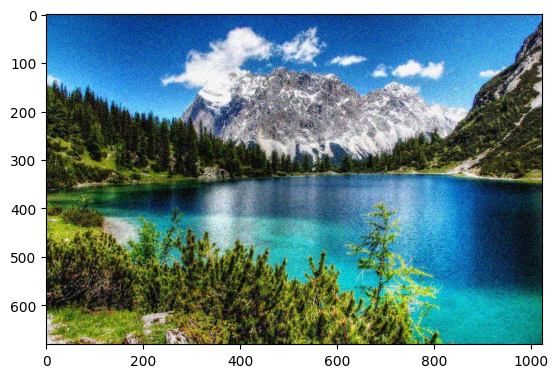

In [3]:
original_image = np.load('data/img.npy')

img = skimage.util.random_noise(original_image)
plt.imshow(img)

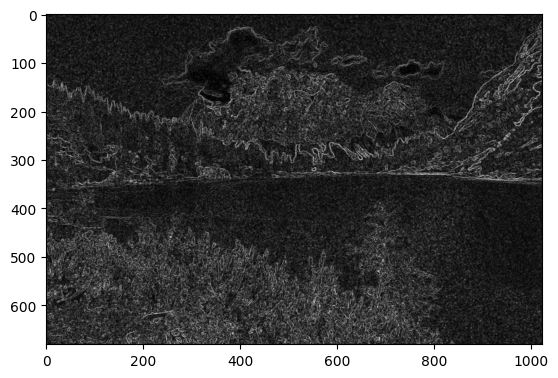

In [4]:
img_med = med(img, size=2)
img_edge = edge_sobel(img_med)
plt.imshow(img_edge, cmap="gray")

Now let's try with the more blurred gaussian filtered image.

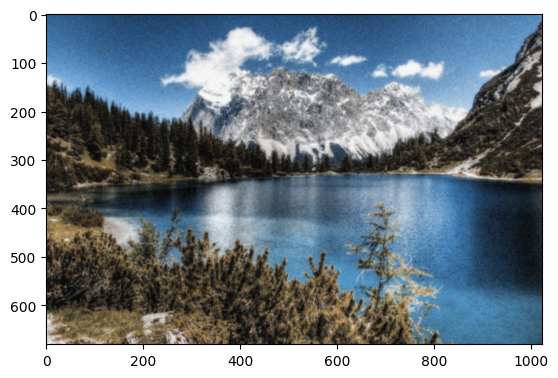

In [5]:
img_gauss = gauss(img, sigma=1)   
plt.imshow(img_gauss)

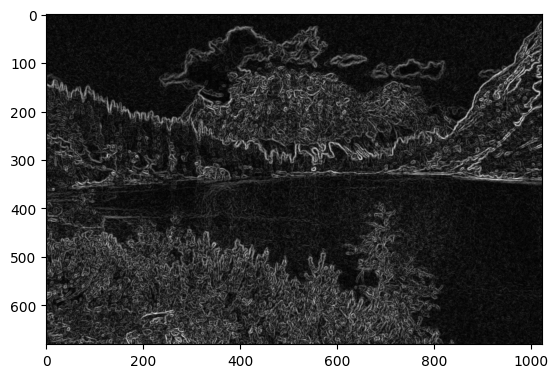

In [6]:
img_edge = edge_sobel(img_gauss)
plt.imshow(img_edge, cmap="gray")

## Canny Edge Detection <a class="anchor" id="canny" ></a>

Steps:
1. Noise Reduction
2. Gradient Calculation
3. Non-maximum Supression
4. Double Threshold
5. Edge Tracking by Hysteresis

**Pre-requisite:** Convert the image to grayscale before algorithm.

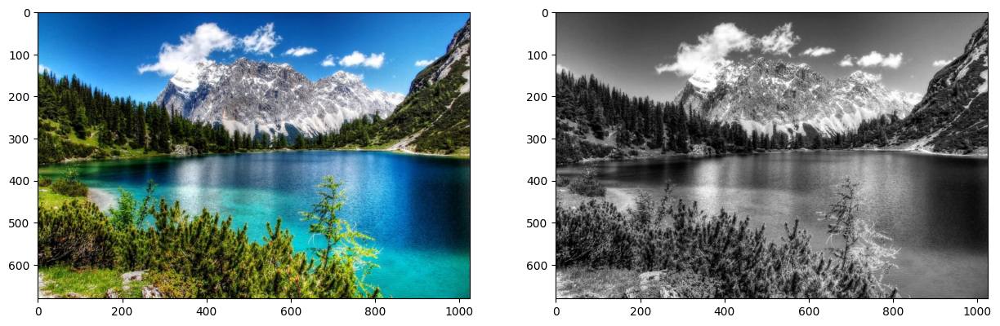

In [7]:
img = cv2.imread('data/image.jpg')

img_color = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_color)
plt.subplot(1, 2, 2)
plt.imshow(img_gray, cmap="gray")

### 1. Noise Reduction
Edge detection are highly sensitive to image noise due to the derivatives behind the algorithm.

We can apply a Gaussian Kernel, the size of the kernel depends on the expected blurring effect. The smaller the less blurring effect.

Equation for Gaussian Kernel of size $(2k+1) \times (2k+1)$

$$
H_{i, j} = \frac{1}{2\pi\sigma^2}exp(-\frac{(i-(k+1))^2 + (j-(k+1))^2}{2\sigma^2}); 1\leq i, j \leq (2k+1)
$$

In [8]:
def gaussian_kernel(size, sigma=1):
    size = int(size) // 2
    x, y = np.mgrid[-size:size+1, -size:size+1]
    normal = 1 / (2.0 * np.pi * sigma**2)
    g =  np.exp(-((x**2 + y**2) / (2.0*sigma**2))) * normal
    return g

### 1.1 Sigma Parameter $\sigma$

In [9]:
# Change this parameter
sigma = 10 # 1, 3, 5, 10, 20, ...

### 1.2 Kernel Size Parameter

In [10]:
kernel_size = 3

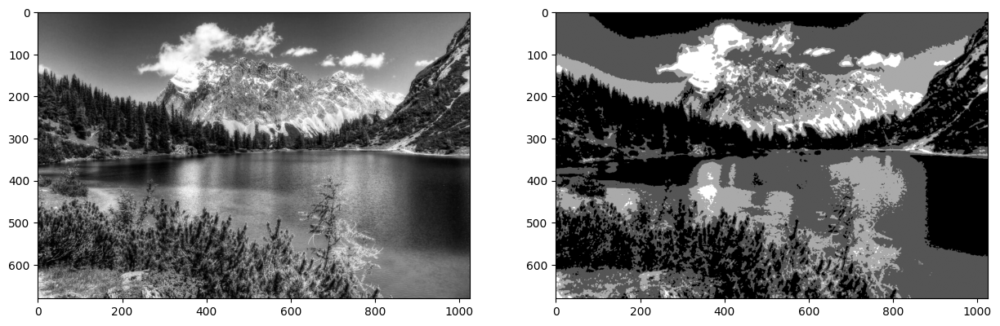

In [11]:
img_gaussian = convolve(img_gray, gaussian_kernel(kernel_size, sigma))

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_gaussian, cmap="gray")

### 2. Gradient Calculation

Edges correspond to a change of pixels intensity. 

To detect it, the easiest way is to apply filters that highlight this intensity change in both directions: 
- horizontal $(x)$ 
- and vertical $(y)$

It can be implemented by convoling $I$ with *Sobel kernels* $Kx$ and $Ky$

$$
K_x = \begin{bmatrix}
-1 & 0 & 1\\
-2 & 0 & 2\\
-1 & 0 & 1
\end{bmatrix}, K_y = \begin{bmatrix}
1 & 2& 1\\
0 & 0 & 0\\
-1 & -2 & -1
\end{bmatrix}
$$

Then, the magnitude $G$ and the slope $\theta$ of the gradient are calculated as follow:

$$
|G| = \sqrt{I_x^2 + I_y^2},
\theta(x, y) = arctan(\frac{I_y}{I_x})
$$

In [12]:
def sobel_filters(img):
    Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
    Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], np.float32)
    
    Ix = ndimage.convolve(img, Kx)
    Iy = ndimage.convolve(img, Ky)
    
    G = np.hypot(Ix, Iy)
    G = G / G.max() * 255
    theta = np.arctan2(Iy, Ix)
    
    return (G, theta)

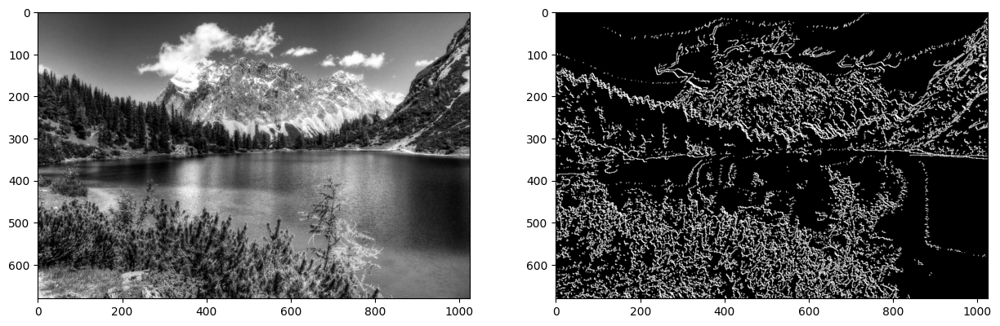

In [13]:
G, theta = sobel_filters(img_gaussian)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(G, cmap="gray")

### 3. Non-Maximum supression

1. Create a matrix initialized to 0 of the same size of the original gradient intensity matrix
2. Identify the edge direction based on the angle value from the angle matrix
3. Check if the pixel in the same direction has a higher intensity than the pixel that is currently processed
4. Return the image processed with the non-max suppression algorithm.

In [14]:
def non_max_suppression(img, D):
    M, N = img.shape
    Z = np.zeros((M,N), dtype=np.int32)
    angle = D * 180. / np.pi
    angle[angle < 0] += 180

    
    for i in range(1,M-1):
        for j in range(1,N-1):
            try:
                q = 255
                r = 255
                
               #angle 0
                if (0 <= angle[i,j] < 22.5) or (157.5 <= angle[i,j] <= 180):
                    q = img[i, j+1]
                    r = img[i, j-1]
                #angle 45
                elif (22.5 <= angle[i,j] < 67.5):
                    q = img[i+1, j-1]
                    r = img[i-1, j+1]
                #angle 90
                elif (67.5 <= angle[i,j] < 112.5):
                    q = img[i+1, j]
                    r = img[i-1, j]
                #angle 135
                elif (112.5 <= angle[i,j] < 157.5):
                    q = img[i-1, j-1]
                    r = img[i+1, j+1]

                if (img[i,j] >= q) and (img[i,j] >= r):
                    Z[i,j] = img[i,j]
                else:
                    Z[i,j] = 0

            except IndexError as e:
                pass
    
    return Z

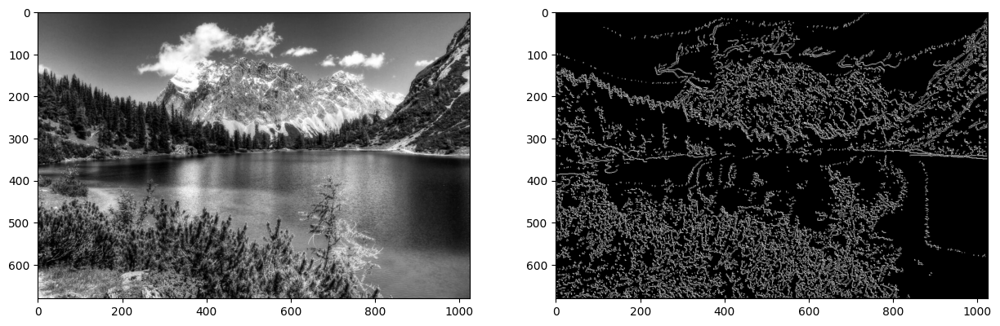

In [15]:
img_nonmax = non_max_suppression(G, theta)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_nonmax, cmap="gray")

### 4. Double threshold

- Strong pixels are pixels that have an intensity so high that we are sure they contribute to the final edge.
- Weak pixels are pixels that have an intensity value that is not enough to be considered as strong ones, but yet not small enough to be considered as non-relevant for the edge detection.
- Other pixels are considered as non-relevant for the edge.

In [16]:
def threshold(img, lowThresholdRatio=0.05, highThresholdRatio=0.09):
    
    highThreshold = img.max() * highThresholdRatio;
    lowThreshold = highThreshold * lowThresholdRatio;
    
    M, N = img.shape
    res = np.zeros((M,N), dtype=np.int32)
    
    weak = np.int32(25)
    strong = np.int32(255)
    
    strong_i, strong_j = np.where(img >= highThreshold)
    zeros_i, zeros_j = np.where(img < lowThreshold)
    
    weak_i, weak_j = np.where((img <= highThreshold) & (img >= lowThreshold))
    
    res[strong_i, strong_j] = strong
    res[weak_i, weak_j] = weak
    
    return (res)

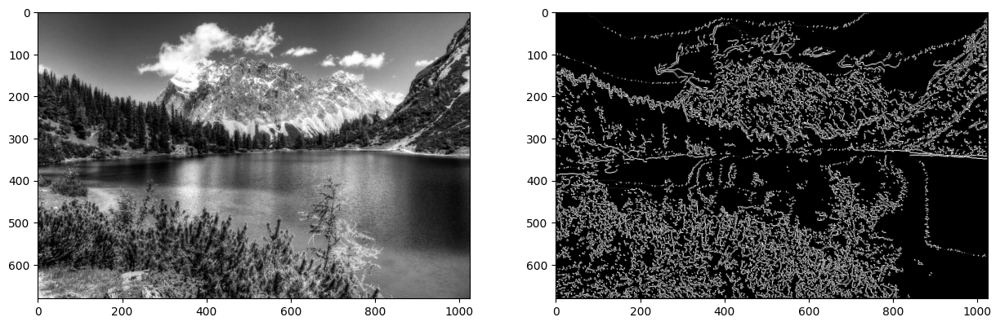

In [17]:
img_threshold = threshold(img_nonmax)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_threshold, cmap="gray")

### 5. Edge Tracking by Hysteresis

The hysteresis consists of transforming weak pixels into strong ones, if and only if at least one of the pixels around the one being processed is a strong one

In [18]:
def hysteresis(img, weak = 75, strong=255):
    M, N = img.shape  
    for i in range(1, M-1):
        for j in range(1, N-1):
            if (img[i,j] == weak):
                try:
                    if ((img[i+1, j-1] == strong) or (img[i+1, j] == strong) or (img[i+1, j+1] == strong)
                        or (img[i, j-1] == strong) or (img[i, j+1] == strong)
                        or (img[i-1, j-1] == strong) or (img[i-1, j] == strong) or (img[i-1, j+1] == strong)):
                        img[i, j] = strong
                    else:
                        img[i, j] = 0
                except IndexError as e:
                    pass
    return img

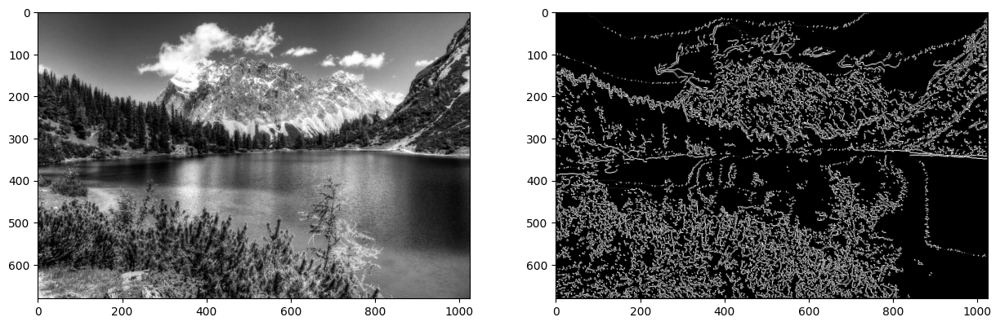

In [19]:
img_final = hysteresis(img_threshold)

plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
plt.imshow(img_gray, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(img_final, cmap="gray")

# > Solution

## 1 - Modify the sigma value and observe the changes in the detected lines

**Research Background**

* **Canny Edge Detection Overview**

    The Canny edge detection algorithm, introduced by John Canny in 1986, remains one of the most widely used edge detection methods in computer vision due to its optimal performance in detecting true edges while minimizing false positives (Canny, 1986). The algorithm operates through a multi-stage process designed to identify intensity discontinuities in digital images that correspond to object boundaries.

    The Canny detector employs five distinct stages: (1) noise reduction through Gaussian filtering, (2) gradient calculation using derivative operators, (3) non-maximum suppression to thin edges, (4) double thresholding to classify edge pixels, and (5) edge tracking by hysteresis to connect fragmented edges (Gonzalez & Woods, 2018). This systematic approach ensures robust edge detection across various image conditions and noise levels.

* **The Sigma Parameter in Gaussian Filtering**

    The sigma (σ) parameter in the Canny algorithm controls the standard deviation of the Gaussian kernel applied during the noise reduction stage. This parameter fundamentally determines the trade-off between noise suppression and edge localization accuracy. A larger σ value produces stronger smoothing effects, which reduces sensitivity to noise and fine details but may blur genuine edges. Conversely, a smaller σ value preserves finer details and edge precision but increases susceptibility to noise artifacts (Sonka et al., 2014).

    The Gaussian kernel used in the first stage is mathematically defined as:

    $$
    G(x, y) = \frac{1}{2\pi\sigma^2} \exp\left(-\frac{x^2 + y^2}{2\sigma^2}\right)
    $$

    where the σ parameter directly influences the spatial extent of the smoothing operation. As Canny (1986) noted in the original work, the selection of σ represents a critical design choice that must balance the competing objectives of noise reduction and edge detection accuracy. In practice, σ values typically range from 0.5 to 2.0 for most applications, though specific values should be tuned based on image characteristics and the scale of features of interest.

**References**

- Canny, J. (1986). A computational approach to edge detection. *IEEE Transactions on Pattern Analysis and Machine Intelligence*, 8(6), 679-698. https://doi.org/10.1109/TPAMI.1986.4767851

- Gonzalez, R. C., & Woods, R. E. (2018). *Digital Image Processing* (4th ed.). Pearson.

- Sonka, M., Hlavac, V., & Boyle, R. (2014). *Image Processing, Analysis, and Machine Vision* (4th ed.). Cengage Learning.

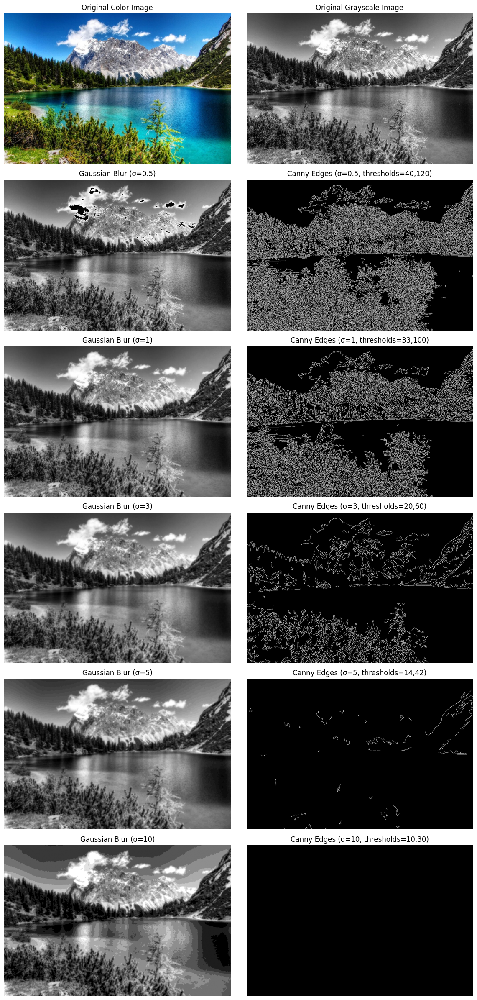

In [20]:
# Load and convert image to grayscale
img = cv2.imread("data/image.jpg")
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Define sigma values to test
sigma_values = [0.5, 1, 3, 5, 10]

# Create plot
fig, axes = plt.subplots(len(sigma_values) + 1, 2, figsize=(12, 4 * (len(sigma_values) + 1)))

# Display original images
axes[0, 0].imshow(img_rgb)
axes[0, 0].set_title('Original Color Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(img_gray, cmap='gray')
axes[0, 1].set_title('Original Grayscale Image')
axes[0, 1].axis('off')

# Process with different sigma values
for i, sigma in enumerate(sigma_values):
    # Apply Gaussian filter
    img_gaussian = ndimage.convolve(img_gray, gaussian_kernel(5, sigma))
    
    # Adjust thresholds inversely with sigma to compensate for reduced gradients
    # This ensures edges are still detected at higher sigma values
    low_threshold = max(10, int(50 / (1 + sigma/2)))
    high_threshold = max(30, int(150 / (1 + sigma/2)))
    
    # Apply Canny edge detection with adjusted thresholds
    edges = cv2.Canny(img_gaussian.astype(np.uint8), low_threshold, high_threshold)
    
    # Display results
    axes[i+1, 0].imshow(img_gaussian, cmap='gray')
    axes[i+1, 0].set_title(f'Gaussian Blur (σ={sigma})')
    axes[i+1, 0].axis('off')
    
    axes[i+1, 1].imshow(edges, cmap='gray')
    axes[i+1, 1].set_title(f'Canny Edges (σ={sigma}, thresholds={low_threshold},{high_threshold})')
    axes[i+1, 1].axis('off')

plt.tight_layout()
plt.show()

The experimental results demonstrate the significant impact of the Gaussian smoothing parameter σ on the performance of Canny edge detection. As observed, increasing the σ value produces a systematic progression of edge detection characteristics:

At lower σ values (0.5-1), the algorithm preserves fine details and textures but remains susceptible to noise, resulting in a dense edge map with numerous small features detected. As σ increases to intermediate values (3), a more balanced representation emerges where prominent structural edges are maintained while suppressing finer details and noise.

At higher σ values (5-10), only the most significant edges and boundaries remain visible. The substantial smoothing effect eliminates most fine-grained features, resulting in a sparse but clean edge representation that highlights only the dominant structural components of the image. This progressive reduction in detected edges correlates directly with the increased blurring effect, which reduces gradient magnitudes and necessitates corresponding threshold adjustments.

These findings confirm the theoretical understanding that the σ parameter serves as a scale-space control mechanism, allowing the Canny detector to operate at different levels of detail. The adjustment of threshold values inversely proportional to σ was necessary to maintain edge detection capabilities across the spectrum of smoothing levels, highlighting the interdependence between the Gaussian filtering and threshold selection stages of the algorithm.

This experiment demonstrates the importance of parameter tuning in edge detection applications, where the optimal σ value should be selected based on the specific requirements of the task: whether prioritizing detail preservation, noise suppression, or structural boundary extraction.

## 2 - Analyze the behavior of the Canny Detector with and without noise removal

**Research Background**

* **Noise in Digital Images**: 
    
    Digital image noise refers to random variations in brightness or color information that degrade image quality. This unwanted signal can originate from various sources including sensor limitations, transmission errors, and environmental factors during image acquisition (Gonzalez & Woods, 2018). The presence of noise in digital images poses significant challenges for edge detection algorithms, which rely on identifying local discontinuities in pixel intensity. Common noise patterns encountered in image processing include:

    * **Gaussian noise** (additive white noise): Follows a Gaussian distribution and affects all pixels independently, appearing as grainy texture across the entire image.

    * **Salt-and-pepper noise** (impulse noise): Manifests as randomly occurring white and black pixels, resembling scattered salt and pepper.

    * **Speckle noise** (multiplicative noise): Commonly found in coherent imaging systems such as radar and ultrasound, where the noise is proportional to the image intensity values.

* **Noise Effects on Edge Detection**: 
    
    The Canny edge detection algorithm, while designed to be optimal in terms of detection, localization, and minimal response criteria, remains vulnerable to noise effects. This vulnerability stems from its reliance on gradient computation, which inherently amplifies high-frequency components including noise. Edge detection algorithms fundamentally depend on calculating intensity gradients to identify boundaries. Noise directly interferes with this process in several ways:

    * **False edge detection**: Noise creates local intensity variations that can be misinterpreted as edges, resulting in spurious edge points.

    * **Edge fragmentation**: Noise can disrupt true edge continuity, causing breaks in detected edge contours that should be continuous.

    * **Edge position inaccuracy**: Random intensity fluctuations can shift the perceived position of an edge, reducing the precision of boundary localization.

    * **Threshold sensitivity**: Noise makes optimal threshold selection more challenging, as lower thresholds needed to detect subtle edges also increase false positive detections from noise (Canny, 1986).

* **Noise Removal Techniques for Edge Detection**: 
    
    The selection of an appropriate noise removal method significantly impacts the performance of subsequent edge detection. The ideal preprocessing technique should effectively suppress noise while minimizing the blurring of genuine edge features. Several preprocessing approaches have been developed to mitigate noise effects before edge detection:

    * **Gaussian filtering**: This technique uses a weighted average of pixel neighborhoods with weights defined by a Gaussian function. It effectively reduces noise but tends to blur edges, potentially reducing detection accuracy.

    * **Median filtering**: As a non-linear technique, median filtering replaces each pixel with the median value of its neighborhood. It is particularly effective against salt-and-pepper noise while better preserving edge structure compared to Gaussian filtering (Huang et al., 1979).

    * **Bilateral filtering**: This edge-preserving smoothing technique applies spatial averaging without crossing edge boundaries. It considers both spatial proximity and intensity similarity, thereby reducing noise while maintaining edge definition (Tomasi & Manduchi, 1998).

* **Canny Edge Detection and Noise Considerations**

    The Canny edge detection algorithm incorporates noise handling in its design through Gaussian smoothing as its first stage. However, the standard deviation (σ) of this Gaussian filter presents an important design parameter that balances noise reduction against edge preservation. While a larger σ more effectively suppresses noise, it simultaneously blurs edge features, potentially reducing detection accuracy for fine structures (Canny, 1986).

    Research has demonstrated that adaptive preprocessing techniques that consider local image characteristics can outperform fixed Gaussian filtering for noisy images. Recent approaches have explored integrating more sophisticated noise models directly into the edge detection framework to distinguish between gradient changes caused by genuine edges versus those resulting from noise fluctuations (Liu et al., 2020).

**References**

- Canny, J. (1986). A computational approach to edge detection. *IEEE Transactions on Pattern Analysis and Machine Intelligence*, 8(6), 679-698. https://doi.org/10.1109/TPAMI.1986.4767851

- Gonzalez, R. C., & Woods, R. E. (2018). *Digital Image Processing* (4th ed.). Pearson.

- Huang, T., Yang, G., & Tang, G. (1979). A fast two-dimensional median filtering algorithm. *IEEE Transactions on Acoustics, Speech, and Signal Processing*, 27(1), 13-18.

- Liu, J., Tai, X. C., Huang, H., & Huan, Z. (2020). A weighted edge detection algorithm for hyperspectral image. *Signal Processing*, 170, 107445.

- Tomasi, C., & Manduchi, R. (1998). Bilateral filtering for gray and color images. In *Proceedings of the Sixth International Conference on Computer Vision* (pp. 839-846). IEEE.

In [21]:
# Helper functions
def apply_canny(image, low_threshold=50, high_threshold=150):
    """Apply Canny edge detection with specified thresholds."""
    return cv2.Canny(image.astype(np.uint8), low_threshold, high_threshold)

def add_noise(image, noise_type='gaussian', amount=0.05):
    """Add different types of noise to an image."""
    if noise_type == 'gaussian':
        return util.random_noise(image, mode='gaussian', var=amount)
    elif noise_type == 'salt_pepper':
        return util.random_noise(image, mode='s&p', amount=amount)
    elif noise_type == 'speckle':
        return util.random_noise(image, mode='speckle', var=amount)
    else:
        raise ValueError(f"Unsupported noise type: {noise_type}")

In [22]:
def compare_noise_removal_effects(
        image_path, noise_types=['gaussian', 'salt_pepper', 'speckle'], 
        noise_amount=0.05, 
        filter_size=5
    ):
    """
    Compare Canny edge detection with and without noise removal for different noise types.
    
    Parameters:
    -----------
    image_path : str
        Path to the input image
    noise_types : list
        List of noise types to apply ('gaussian', 'salt_pepper', 'speckle')
    noise_amount : float
        Amount of noise to add
    filter_size : int
        Size of the Gaussian filter for noise removal
    """
    # Load and convert image to grayscale
    img = cv2.imread(image_path)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Create figure for results
    fig, axes = plt.subplots(len(noise_types), 3, figsize=(15, 5 * len(noise_types)))
    
    # If only one noise type, make axes 2D for consistent indexing
    if len(noise_types) == 1:
        axes = np.expand_dims(axes, axis=0)
    
    for i, noise_type in enumerate(noise_types):
        # Add noise to the image
        noisy_image = add_noise(img_gray, noise_type=noise_type, amount=noise_amount)
        noisy_image = (noisy_image * 255).astype(np.uint8)
        
        # Apply Canny directly to noisy image (without noise removal)
        edges_without_removal = apply_canny(noisy_image)
        
        # Apply Gaussian filter for noise removal
        filtered_image = cv2.GaussianBlur(noisy_image, (filter_size, filter_size), 1.5)
        
        # Apply Canny to filtered image (with noise removal)
        edges_with_removal = apply_canny(filtered_image)
        
        # Display results
        axes[i, 0].imshow(noisy_image, cmap='gray')
        axes[i, 0].set_title(f'Noisy Image ({noise_type.replace("_", " ").title()})')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(edges_without_removal, cmap='gray')
        axes[i, 1].set_title('Canny Without Noise Removal')
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(edges_with_removal, cmap='gray')
        axes[i, 2].set_title('Canny With Noise Removal')
        axes[i, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

In [23]:
def assess_noise_removal_methods(image_path, noise_type='gaussian', noise_amount=0.02):
    """
    Compare different noise removal methods before applying Canny edge detection.
    
    Parameters:
    -----------
    image_path : str
        Path to the input image
    noise_type : str
        Type of noise to apply
    noise_amount : float
        Amount of noise to add
    """
    # Load and convert image to grayscale
    img = cv2.imread(image_path)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Add noise to the image
    noisy_image = add_noise(img_gray, noise_type=noise_type, amount=noise_amount)
    noisy_image = (noisy_image * 255).astype(np.uint8)
    
    # Apply different noise removal methods
    # 1. Gaussian Filter
    gaussian_filtered = cv2.GaussianBlur(noisy_image, (5, 5), 1.5)
    
    # 2. Median Filter
    median_filtered = cv2.medianBlur(noisy_image, 5)
    
    # 3. Bilateral Filter (preserves edges better)
    bilateral_filtered = cv2.bilateralFilter(noisy_image, 9, 75, 75)
    
    # Apply Canny edge detection to all images
    edges_original = apply_canny(img_gray)
    edges_noisy = apply_canny(noisy_image)
    edges_gaussian = apply_canny(gaussian_filtered)
    edges_median = apply_canny(median_filtered)
    edges_bilateral = apply_canny(bilateral_filtered)
    
    # Create figure for visualization
    fig, axes = plt.subplots(2, 5, figsize=(20, 8))
    
    # Row 1: Images
    images = [img_gray, noisy_image, gaussian_filtered, median_filtered, bilateral_filtered]
    titles_row1 = [
        'Original', f'Noisy ({noise_type.title()})', 'Gaussian Filter', 
        'Median Filter', 'Bilateral Filter'
    ]
    
    for i, (image, title) in enumerate(zip(images, titles_row1)):
        axes[0, i].imshow(image, cmap='gray')
        axes[0, i].set_title(title)
        axes[0, i].axis('off')
    
    # Row 2: Corresponding edge maps
    edges = [edges_original, edges_noisy, edges_gaussian, edges_median, edges_bilateral]
    titles_row2 = [
        'Edges (Original)', 'Edges (Noisy)', 'Edges (Gaussian)', 
        'Edges (Median)', 'Edges (Bilateral)'
    ]
    
    for i, (edge, title) in enumerate(zip(edges, titles_row2)):
        axes[1, i].imshow(edge, cmap='gray')
        axes[1, i].set_title(title)
        axes[1, i].axis('off')
    
    plt.tight_layout()
    plt.show()

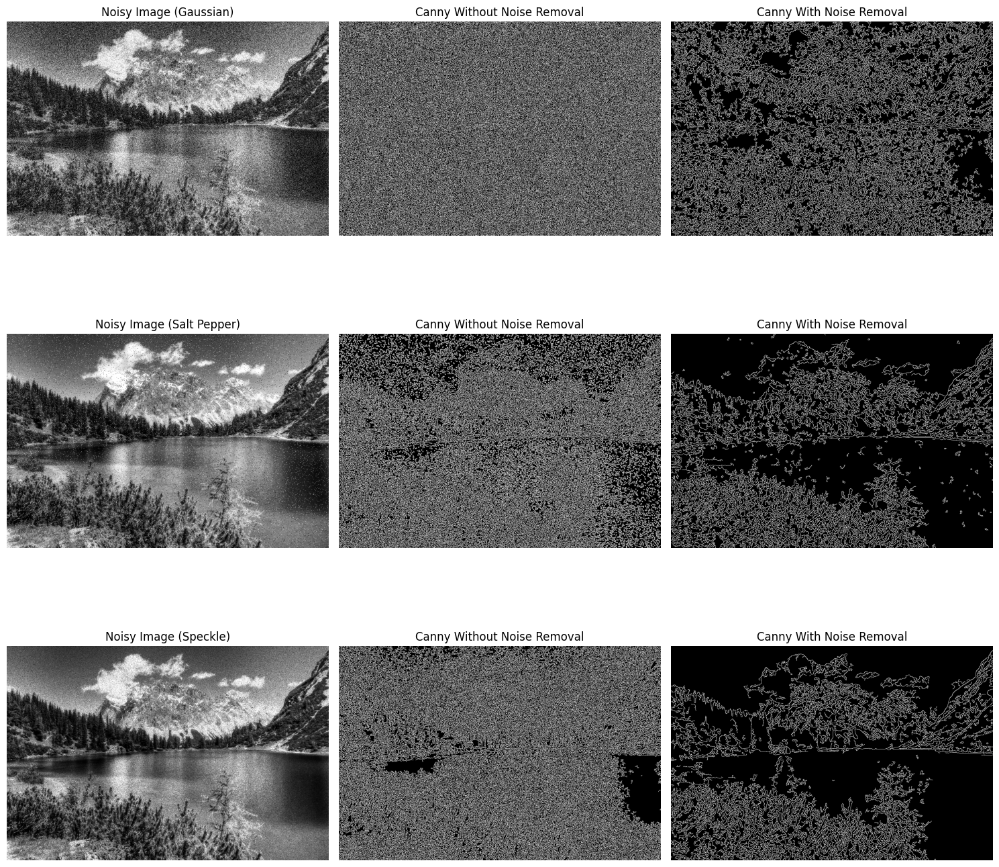

In [24]:
# Experiment 1: Compare edge detection with and without noise removal
compare_noise_removal_effects("data/image.jpg")

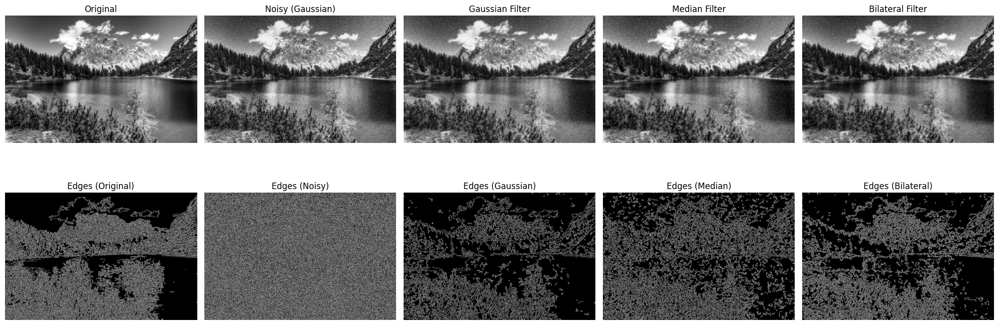

In [25]:
# Experiment 2: Compare different noise removal methods
assess_noise_removal_methods("data/image.jpg")

The experimental results demonstrate the significant impact of noise removal preprocessing on the effectiveness of Canny edge detection. Applying the Canny detector directly to noisy images results in considerable performance degradation, characterized by false edge detections and poor edge localization. This is particularly evident in the edge maps generated from unfiltered noisy images, which show little resemblance to the true structural boundaries.

Analysis of different noise types reveals distinct patterns of interference with edge detection. Gaussian noise generates uniform false positives throughout the image, while salt-and-pepper noise produces isolated but strong edge responses. Speckle noise creates clustered false edges that reflect its multiplicative nature. In all cases, appropriate preprocessing substantially improved the quality of detected edges.

The comparative evaluation of filtering techniques shows that each method has specific strengths related to noise characteristics. Gaussian filtering effectively reduces general noise but sacrifices some edge definition through blurring. Median filtering demonstrates superior performance with impulse noise while preserving edge sharpness. Bilateral filtering achieves the best balance between noise suppression and edge preservation, albeit with increased computational demands.

These findings underscore that edge detection fundamentally depends on accurately distinguishing true intensity discontinuities from noise variations. Proper noise removal should be considered an essential preprocessing step, particularly for images acquired in challenging conditions. The selection of an appropriate filtering technique should be guided by both the predominant noise characteristics and the specific application requirements regarding edge fidelity and processing efficiency. This study confirms that appropriate noise handling significantly enhances the robustness and accuracy of the Canny edge detection algorithm.

## 3 - Experiment with images with different numbers of lines and texture to observe the behavior of the algorithm

**Research Background**

Edge detection algorithms, particularly the Canny detector, exhibit varying performance characteristics when applied to images with different texture complexities and line distributions. Understanding these variations is essential for optimizing edge detection parameters across diverse image types and application domains.

* **Texture Complexity and Edge Detection**

    Texture in digital images refers to the spatial variation of pixel intensities that form repeating or structured patterns. From an edge detection perspective, texture complexity can be categorized along a spectrum from low to high (Nixon & Aguado, 2019). The Canny edge detector, like most gradient-based approaches, fundamentally responds to local intensity changes. In highly textured regions, the algorithm may detect numerous edges that represent texture elements rather than object boundaries, potentially obscuring the structural edges of interest (Belongie et al., 1998):

    * **Low texture complexity**: Images with minimal intensity variations, large homogeneous regions, and sparse, well-defined boundaries. Examples include simple geometric shapes, silhouettes, and artificial scenes with distinct objects against uniform backgrounds.

    * **Medium texture complexity**: Images with moderate intensity variations, structured patterns, and a mix of smooth regions and detailed areas. Examples include urban scenes, architectural photographs, and regular patterns like fabrics or grids.

    * **High texture complexity**: Images with significant intensity variations at multiple scales, irregular patterns, and densely packed details. Examples include natural scenes with foliage, textiles with intricate designs, and microscopic biological structures.

* **Line Characteristics and Edge Detection**

    The distribution and characteristics of lines in an image significantly influence edge detection outcomes:

    * **Line density**: Images with sparse, well-separated lines generally yield cleaner edge maps compared to those with densely packed lines, where edge responses may merge or interfere with one another.

    * **Line orientation diversity**: Images containing lines in multiple orientations present challenges for edge detectors that use fixed directional kernels, though the Canny algorithm's omnidirectional approach mitigates this issue.

    * **Line curvature**: Straight lines are typically detected with higher accuracy than curved lines, as the latter may be fragmented during the non-maximum suppression stage if the curvature exceeds certain thresholds relative to the scale of analysis.

    * **Line width variation**: Thin lines produce more precise edge localization, while thick lines may generate double edges at their boundaries, requiring parameter adjustments for optimal detection.

* **Parameter Sensitivity Across Image Types**

    The optimal parameters for Canny edge detection, primarily the Gaussian smoothing sigma (σ) and the hysteresis thresholds, exhibit strong dependencies on the texture and line characteristics of the input image. Understanding these relationships enables more effective parameter selection and potentially the development of adaptive edge detection approaches that automatically adjust parameters based on local texture characteristics:

    * **Sigma parameter**: For low-texture images with clear boundaries, smaller sigma values (0.5-1.0) typically yield optimal results by preserving edge localization. Conversely, highly textured images often benefit from larger sigma values (1.5-3.0) to suppress texture details while preserving structural edges (Bovik, 2010).

    * **Threshold parameters**: The optimal threshold values correlate with the image's contrast characteristics and noise level. Low-texture images with high contrast generally perform well with higher threshold values, while textured images may require lower thresholds to detect meaningful boundaries among texture elements.

    * **Scale considerations**: Multi-scale approaches that apply edge detection at multiple sigma values can effectively capture both fine details and coarse structures across varying texture complexities, though at increased computational cost.

**References**

- Belongie, S., Carson, C., Greenspan, H., & Malik, J. (1998). Color- and texture-based image segmentation using EM and its application to content-based image retrieval. In *Proceedings of the Sixth International Conference on Computer Vision* (pp. 675-682). IEEE.

- Bovik, A. C. (2010). *Handbook of Image and Video Processing* (2nd ed.). Academic Press.

- Nixon, M., & Aguado, A. (2019). *Feature Extraction and Image Processing for Computer Vision* (4th ed.). Academic Press.

In [26]:
def apply_canny(image, sigma=1.0, low_threshold=50, high_threshold=150):
    """Apply Canny edge detection with specified parameters."""
    # Convert to grayscale if needed
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image.copy()
    
    # Apply Gaussian blur
    blurred = cv2.GaussianBlur(gray, (0, 0), sigma)
    
    # Apply Canny edge detection
    edges = cv2.Canny(blurred.astype(np.uint8), low_threshold, high_threshold)
    
    return edges

In [27]:
def analyze_images(image_paths, image_names, sigma=1.0, low_threshold=50, high_threshold=150):
    """Analyze Canny edge detection on a set of images."""
    n_images = len(image_paths)
    fig, axes = plt.subplots(n_images, 2, figsize=(12, 5 * n_images))
    
    for i, (path, name) in enumerate(zip(image_paths, image_names)):
        # Load and convert image
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Apply Canny edge detection
        edges = apply_canny(image, sigma, low_threshold, high_threshold)
        
        # Calculate edge density (percentage of edge pixels)
        edge_density = np.sum(edges > 0) / (edges.shape[0] * edges.shape[1]) * 100
        
        # Display results
        axes[i, 0].imshow(image)
        axes[i, 0].set_title(f"{name}")
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(edges, cmap='gray')
        axes[i, 1].set_title(f"Canny Edges (σ={sigma}, t={low_threshold},{high_threshold})\nEdge Density: {edge_density:.2f}%")
        axes[i, 1].axis('off')
    
    plt.tight_layout()
    plt.show()

In [28]:
def parameter_sensitivity_analysis(image_path, image_name):
    """Analyze how different parameters affect edge detection for a single image."""
    # Load image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Define parameter values to test
    sigmas = [0.5, 1.0, 2.0]
    thresholds = [(25, 75), (50, 150), (100, 200)]
    
    # Create figure
    fig, axes = plt.subplots(len(sigmas), len(thresholds) + 1, figsize=(15, 12))
    
    # Display original image in first column
    for i in range(len(sigmas)):
        axes[i, 0].imshow(image)
        axes[i, 0].set_title(f"Original ({image_name})")
        axes[i, 0].axis('off')
    
    # Process with different parameters
    for i, sigma in enumerate(sigmas):
        for j, (low, high) in enumerate(thresholds):
            # Apply Canny edge detection
            edges = apply_canny(image, sigma, low, high)
            
            # Calculate edge density
            edge_density = np.sum(edges > 0) / (edges.shape[0] * edges.shape[1]) * 100
            
            # Display result
            axes[i, j+1].imshow(edges, cmap='gray')
            axes[i, j+1].set_title(f"σ={sigma}, t=({low},{high})\nEdge Density: {edge_density:.2f}%")
            axes[i, j+1].axis('off')
    
    plt.tight_layout()
    plt.show()

In [29]:
# Define image paths and names
image_paths = [
    "data/flowers.jpg",
    "data/home.jpg",
    "data/stones.jpg",
    "data/wood.jpg",
    "data/shapes.jpg"
]

image_names = [
    "Flowers (Curved Lines)",
    "Modern Building (Straight Lines)",
    "Stones (Medium Texture)",
    "Wood (Linear Texture)",
    "Geometric Shapes (Simple Forms)"
]

Analyzing all images with default parameters...


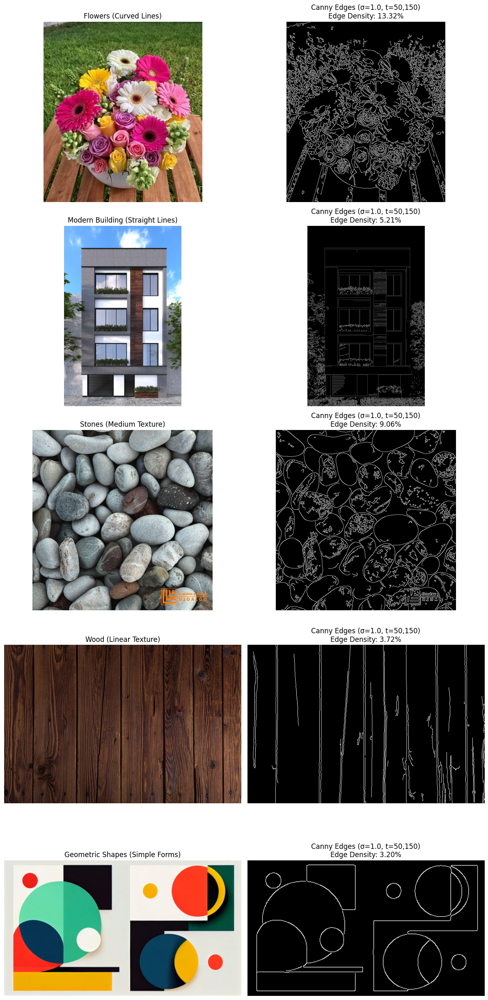

In [30]:
# Analyze all images with default parameters
print("Analyzing all images with default parameters...")
analyze_images(image_paths, image_names)

Analyzing parameter sensitivity for Flowers (Curved Lines)...


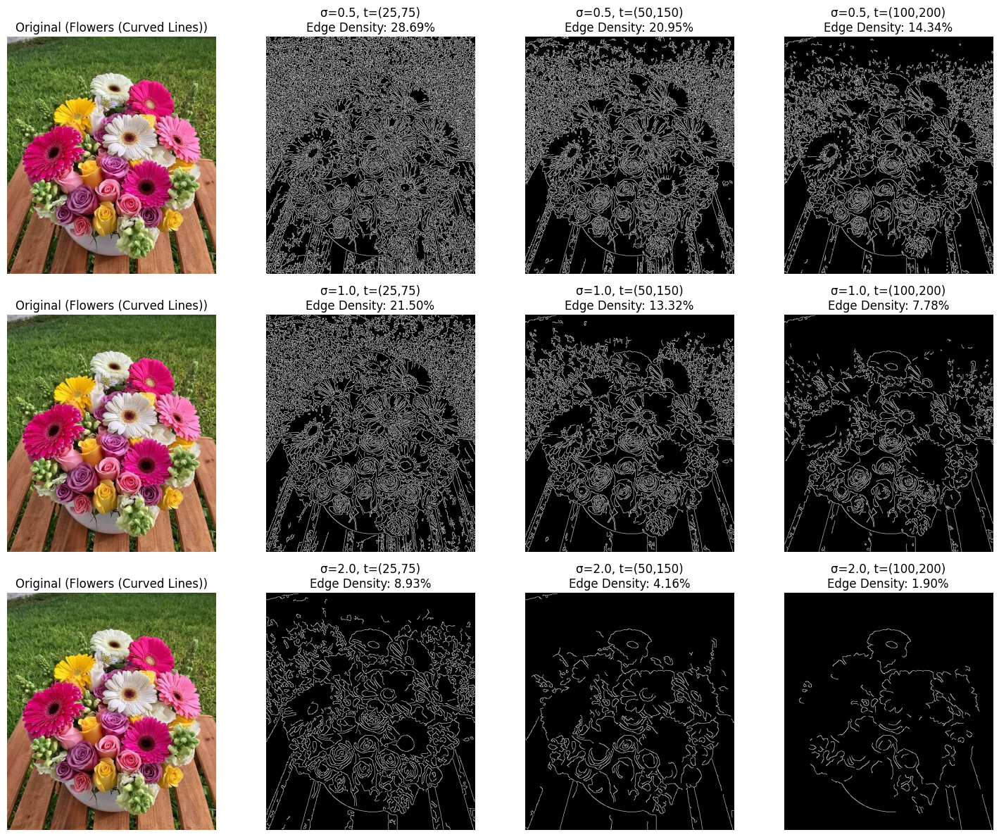

Analyzing parameter sensitivity for Modern Building (Straight Lines)...


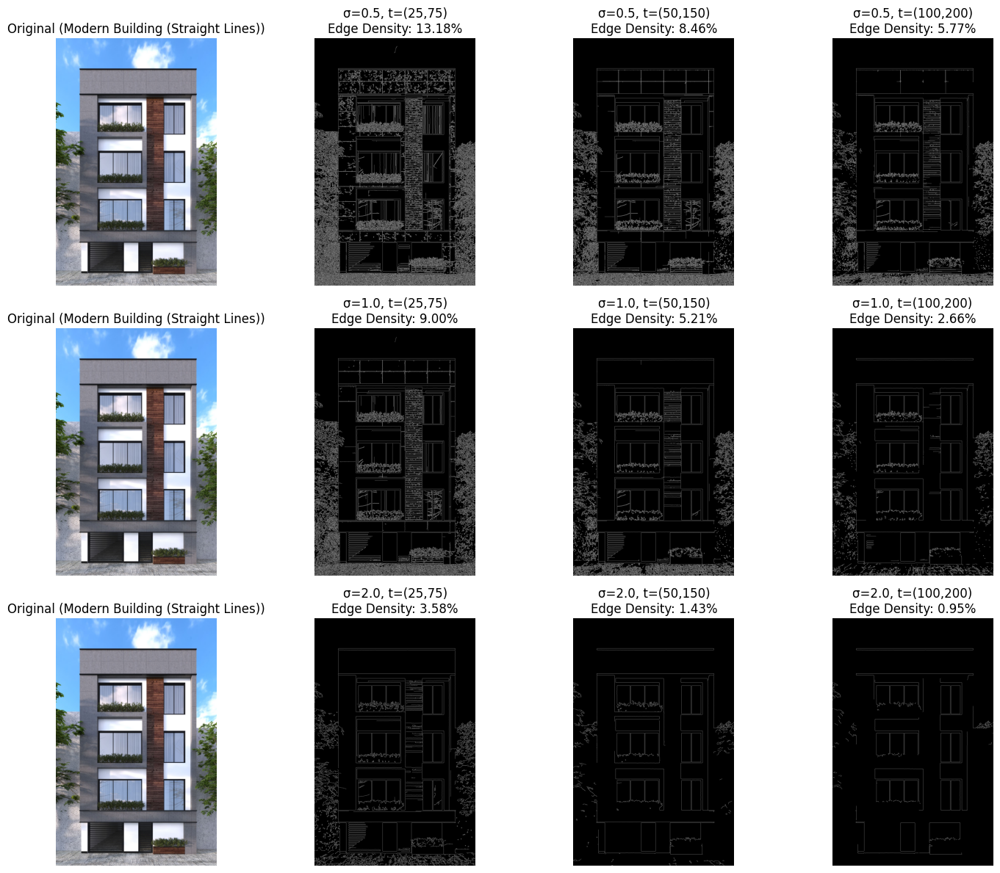

Analyzing parameter sensitivity for Stones (Medium Texture)...


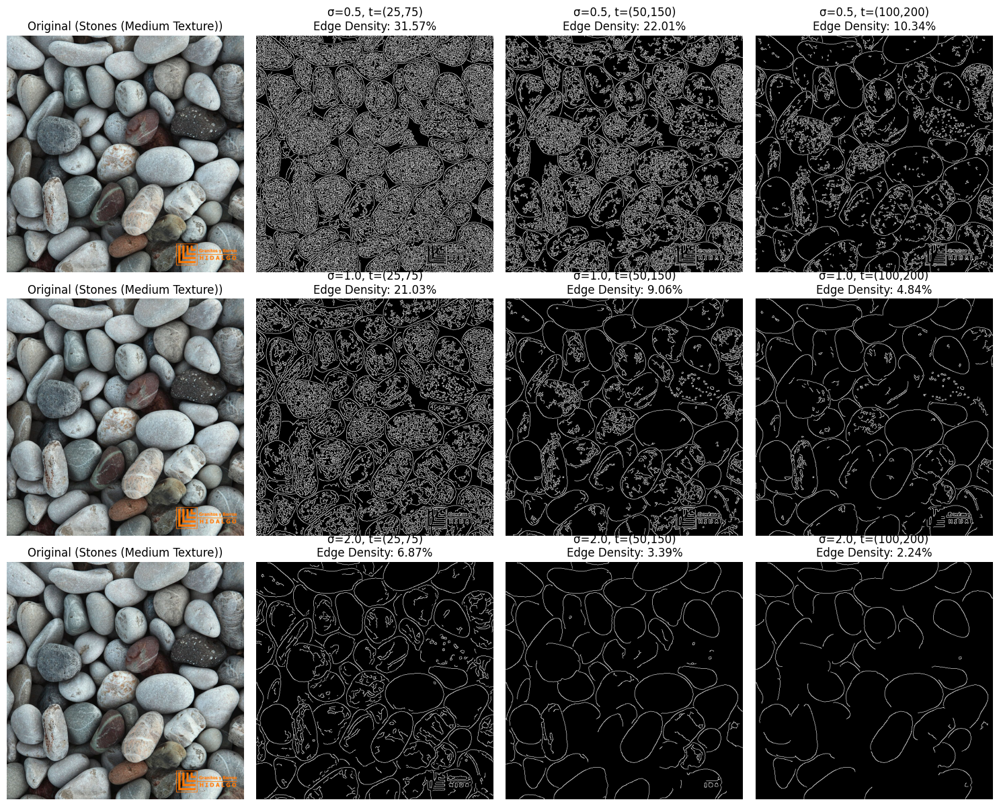

Analyzing parameter sensitivity for Wood (Linear Texture)...


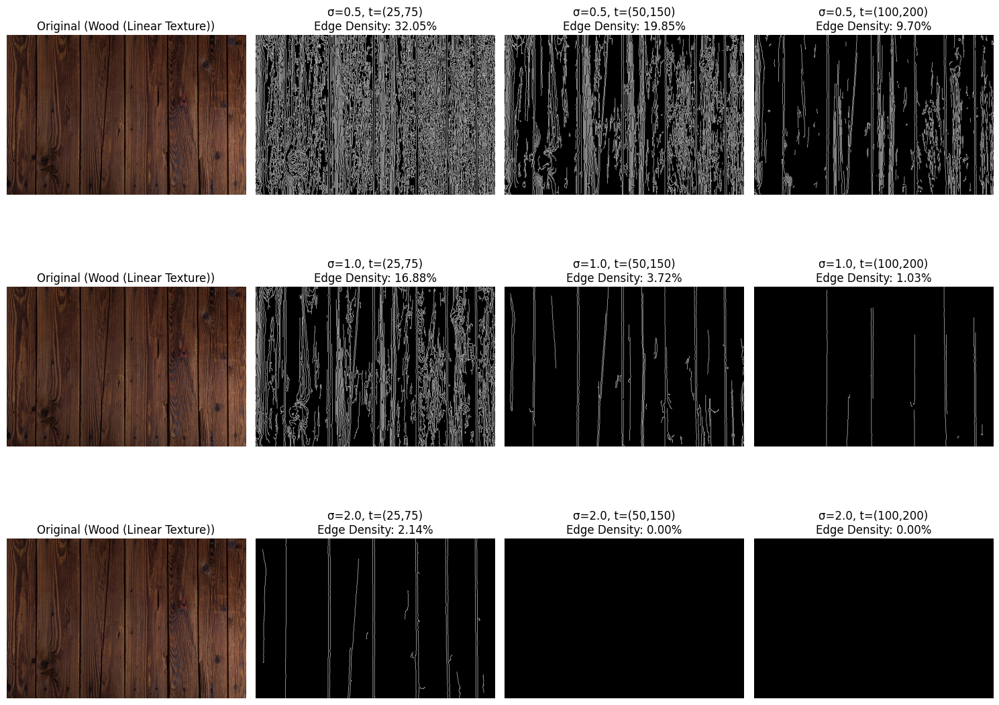

Analyzing parameter sensitivity for Geometric Shapes (Simple Forms)...


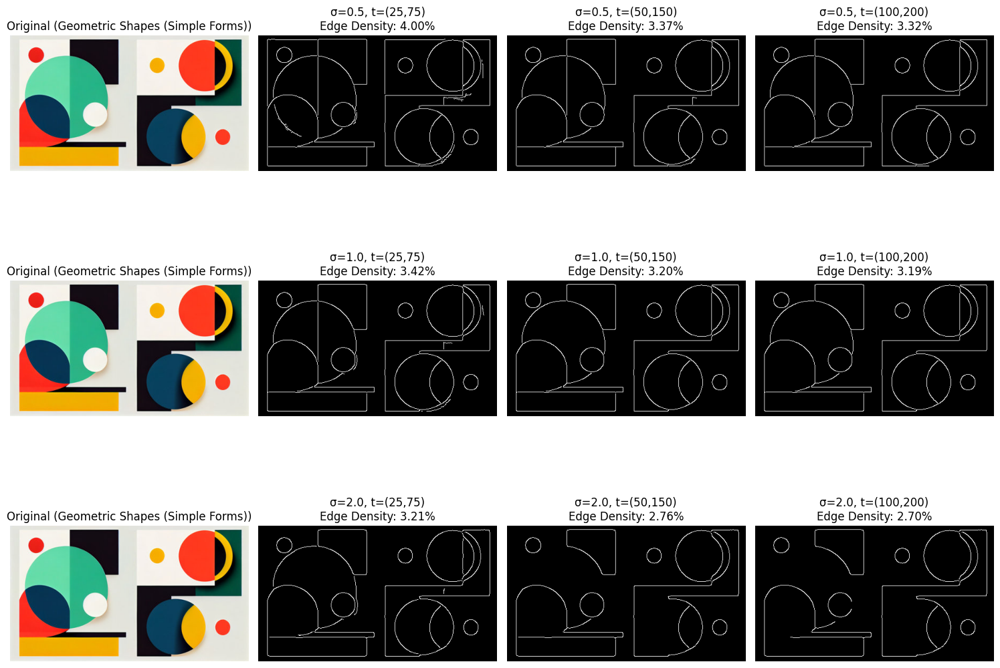

In [31]:
# Analyze parameter sensitivity for each image
for path, name in zip(image_paths, image_names):
    print(f"Analyzing parameter sensitivity for {name}...")
    parameter_sensitivity_analysis(path, name)

The experimental results demonstrate significant variations in Canny edge detection performance across images with different texture complexities and line characteristics. Analysis of edge density metrics and visual inspection of the resulting edge maps reveal several key findings.

In images with high geometric regularity and well-defined boundaries (geometric shapes), the algorithm consistently produced clean, accurate edge maps across various parameter settings. Edge density remained relatively stable (2.70%-4.00%), indicating low sensitivity to parameter variations for images with clear structural boundaries and high contrast.

Conversely, images with organic textures and curved lines (flowers) exhibited high parameter sensitivity, with edge density varying dramatically from 28.69% at lower thresholds to 1.90% at higher values. The algorithm detected numerous texture details at lower thresholds while preserving only major structural boundaries at higher thresholds and sigma values.

The architectural image (modern building) with predominant straight lines showed intermediate sensitivity to parameter changes. Higher sigma values progressively eliminated texture details while preserving the primary structural elements, demonstrating the algorithm's effectiveness for line-dominated imagery when properly parameterized.

Natural textures (stones, wood) revealed distinctive edge detection patterns: stone textures produced well-defined boundary contours at higher sigma values, while wood textures with directional grain patterns showed extreme sensitivity to parameter changes, with edge density dropping from 32.05% to 0% across the parameter spectrum.

These findings confirm that optimal Canny edge detection requires parameter tuning specific to image characteristics. Lower sigma values (0.5-1.0) with moderate thresholds generally preserve more detail across all image types but may introduce noise. Higher sigma values (1.5-2.0) with elevated thresholds isolate structural edges while suppressing texture details, which proves beneficial for applications requiring focus on primary object boundaries.

The relationship between edge density metrics and visual quality of detected edges demonstrates that quantitative measures must be interpreted within the context of specific application requirements: lower edge density does not necessarily indicate poorer performance but may reflect successful noise suppression and feature isolation.

This experiment highlights the importance of adaptive parameter selection based on image texture characteristics and intended application objectives when implementing Canny edge detection in computer vision systems.